In [ ]:
import pandas as pd 
import numpy as np
from wordcloud import WordCloud
import spacy
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [ ]:
df = pd.read_csv("gender-classifier.csv", encoding="latin1")

In [ ]:
df.head()

,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,gender,gender:confidence,profile_yn,profile_yn:confidence,created,...,profileimage,retweet_count,sidebar_color,text,tweet_coord,tweet_count,tweet_created,tweet_id,tweet_location,user_timezone
0,815719226,False,finalized,3,10/26/15 23:24,male,1.0000,yes,1.0,12/5/13 1:48,...,https://pbs.twimg.com/profile_images/414342229...,0,FFFFFF,Robbie E Responds To Critics After Win Against...,NaN,110964,10/26/15 12:40,6.587300e+17,main; @Kan1shk3,Chennai
1,815719227,False,finalized,3,10/26/15 23:30,male,1.0000,yes,1.0,10/1/12 13:51,...,https://pbs.twimg.com/profile_images/539604221...,0,C0DEED,ÛÏIt felt like they were my friends and I was...,NaN,7471,10/26/15 12:40,6.587300e+17,NaN,Eastern Time (US & Canada)
2,815719228,False,finalized,3,10/26/15 23:33,male,0.6625,yes,1.0,11/28/14 11:30,...,https://pbs.twimg.com/profile_images/657330418...,1,C0DEED,i absolutely adore when louis starts the songs...,NaN,5617,10/26/15 12:40,6.587300e+17,clcncl,Belgrade
3,815719229,False,finalized,3,10/26/15 23:10,male,1.0000,yes,1.0,6/11/09 22:39,...,https://pbs.twimg.com/profile_images/259703936...,0,C0DEED,Hi @JordanSpieth - Looking at the url - do you...,NaN,1693,10/26/15 12:40,6.587300e+17,"Palo Alto, CA",Pacific Time (US & Canada)
4,815719230,False,finalized,3,10/27/15 1:15,female,1.0000,yes,1.0,4/16/14 13:23,...,https://pbs.twimg.com/profile_images/564094871...,0,0,Watching Neighbours on Sky+ catching up with t...,NaN,31462,10/26/15 12:40,6.587300e+17,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20050 entries, 0 to 20049
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   _unit_id               20050 non-null  int64  
 1   _golden                20050 non-null  bool   
 2   _unit_state            20050 non-null  object 
 3   _trusted_judgments     20050 non-null  int64  
 4   _last_judgment_at      20000 non-null  object 
 5   gender                 19953 non-null  object 
 6   gender:confidence      20024 non-null  float64
 7   profile_yn             20050 non-null  object 
 8   profile_yn:confidence  20050 non-null  float64
 9   created                20050 non-null  object 
 10  description            16306 non-null  object 
 11  fav_number             20050 non-null  int64  
 12  gender_gold            50 non-null     object 
 13  link_color             20050 non-null  object 
 14  name                   20050 non-null  object 
 15  pr

In [ ]:
df.describe()

,_unit_id,_trusted_judgments,gender:confidence,profile_yn:confidence,fav_number,retweet_count,tweet_count,tweet_id
count,2.005000e+04,20050.000000,20024.000000,20050.000000,20050.000000,20050.000000,2.005000e+04,2.005000e+04
mean,8.157294e+08,3.615711,0.882756,0.993221,4382.201646,0.079401,3.892469e+04,6.587350e+17
std,6.000801e+03,12.331890,0.191403,0.047168,12518.575919,2.649751,1.168371e+05,5.000124e+12
min,8.157192e+08,3.000000,0.000000,0.627200,0.000000,0.000000,1.000000e+00,6.587300e+17
25%,8.157243e+08,3.000000,0.677800,1.000000,11.000000,0.000000,2.398000e+03,6.587300e+17
50%,8.157294e+08,3.000000,1.000000,1.000000,456.000000,0.000000,1.144150e+04,6.587300e+17
75%,8.157345e+08,3.000000,1.000000,1.000000,3315.500000,0.000000,4.002750e+04,6.587400e+17
max,8.157580e+08,274.000000,1.000000,1.000000,341621.000000,330.000000,2.680199e+06,6.587400e+17


In [ ]:
gender_df = pd.DataFrame(df.groupby('gender').count()['_unit_id']).reset_index()

In [ ]:
import plotly.express as px

In [ ]:
fig = px.bar(gender_df, x="gender", y="_unit_id", color="gender",
             title="Distribution of tweets per sender",
             labels={'gender': 'Sender', '_unit_id': ''})

fig.show()

In [ ]:
df.groupby('tweet_created').count()["_unit_id"]

tweet_created
10/26/15 12:39    1952
10/26/15 12:40    8076
10/26/15 13:18     265
10/26/15 13:19    5892
10/26/15 13:20    3865
Name: _unit_id, dtype: int64

In [ ]:
df["tokens"] = None

In [ ]:
pip install texthero

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.9/235.9 KB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.1/211.1 KB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 43.0 MB/s eta 0:00:00
  Attempting uninstall: srsly
    Found existing installation: srsly 2.4.5
    Uninstalling srsly-2.4.5:
      Successfully uninstalled srsly-2.4.5
  Attempting uninstall: catalogue
    Found existing installation: catalogue 2.0.8
    Uninstalling catalogue-2.0.8:
      Successfully uninstalled catalogue-2.0.8
  Attempting uninstall: thinc
    Found existing installation: thinc 8.1.6
    Uninstalling thinc-8.1.6:
      Successfully uninstalled thinc-8.1.6
  Attempting uninstall: spacy
    Found existing installation: spacy 3.4.4
    Uninstalling spacy-3.4.4:
      Successful

In [ ]:
import texthero as hero
import pandas as pd

# Use texthero to clean the text column
df["text_clean"] = hero.clean(df["text"])

# Use texthero to stem the text
df["text_clean"] = hero.stem(df["text_clean"])

# Show the first 5 rows of the dataframe
df.head()


,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,gender,gender:confidence,profile_yn,profile_yn:confidence,created,...,sidebar_color,text,tweet_coord,tweet_count,tweet_created,tweet_id,tweet_location,user_timezone,tokens,text_clean
0,815719226,False,finalized,3,10/26/15 23:24,male,1.0000,yes,1.0,12/5/13 1:48,...,FFFFFF,Robbie E Responds To Critics After Win Against...,NaN,110964,10/26/15 12:40,6.587300e+17,main; @Kan1shk3,Chennai,None,robbi e respond critic win eddi edward worldti...
1,815719227,False,finalized,3,10/26/15 23:30,male,1.0000,yes,1.0,10/1/12 13:51,...,C0DEED,ÛÏIt felt like they were my friends and I was...,NaN,7471,10/26/15 12:40,6.587300e+17,NaN,Eastern Time (US & Canada),None,uiit felt like friend live stori themu https c...
2,815719228,False,finalized,3,10/26/15 23:33,male,0.6625,yes,1.0,11/28/14 11:30,...,C0DEED,i absolutely adore when louis starts the songs...,NaN,5617,10/26/15 12:40,6.587300e+17,clcncl,Belgrade,None,absolut ador loui start song hit hard feel good
3,815719229,False,finalized,3,10/26/15 23:10,male,1.0000,yes,1.0,6/11/09 22:39,...,C0DEED,Hi @JordanSpieth - Looking at the url - do you...,NaN,1693,10/26/15 12:40,6.587300e+17,"Palo Alto, CA",Pacific Time (US & Canada),None,hi jordanspieth look url use ifttt typic see a...
4,815719230,False,finalized,3,10/27/15 1:15,female,1.0000,yes,1.0,4/16/14 13:23,...,0,Watching Neighbours on Sky+ catching up with t...,NaN,31462,10/26/15 12:40,6.587300e+17,NaN,NaN,None,watch neighbour sky catch neighb xxx u/ u/ u/ ...


In [ ]:
nlp = spacy.load('en_core_web_sm')

for index, tweet in enumerate(df.text_clean):
  doc = nlp(tweet)
  
  tokens = []
  for token in doc:
    if token.is_punct or token.is_stop or token.like_url:
      pass
    else:
      tokens.append(token.lemma_)

  
  df["tokens"][index] = tokens

<ipython-input-22-0e9f9b432c4a>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
female = df[df["gender"] == "female"]
male = df[df["gender"] == "male"]
brand = df[df["gender"] == "brand"]

In [ ]:
male.tokens.head()

0    [robbi, e, respond, critic, win, eddi, edward,...
1    [uiit, feel, like, friend, live, stori, themu,...
2    [absolut, ador, loui, start, song, hit, hard, ...
3    [hi, jordanspieth, look, url, use, ifttt, typi...
7    [gala, bingo, club, buy, aps241, m, uk, large,...
Name: tokens, dtype: object

In [ ]:
female['text']

4        Watching Neighbours on Sky+ catching up with t...
5        Ive seen people on the train with lamps, chair...
8        @_Aphmau_ the pic defines all mcd fangirls/fan...
9        @Evielady just how lovely is the tree this yea...
12       Just put my ass on the line for you and this i...
                               ...                        
20039    Especially when all you do is the best you can...
20044    Need A Ride Home From Practice _Ù÷Ô_Ù÷Ô_Ù÷ÔAnd...
20045    @lookupondeath ...Fine, and I'll drink tea too...
20048    @bitemyapp i had noticed your tendency to pee ...
20049    I think for my APUSH creative project I'm goin...
Name: text, Length: 6700, dtype: object

In [ ]:
male_tokens = []
for tokens in male.tokens:
  male_tokens.extend(tokens)

wordcloud = WordCloud (
                        width = 3000,
                        height = 2000,
                        background_color = 'black',
                        ).generate(' '.join(male_tokens))

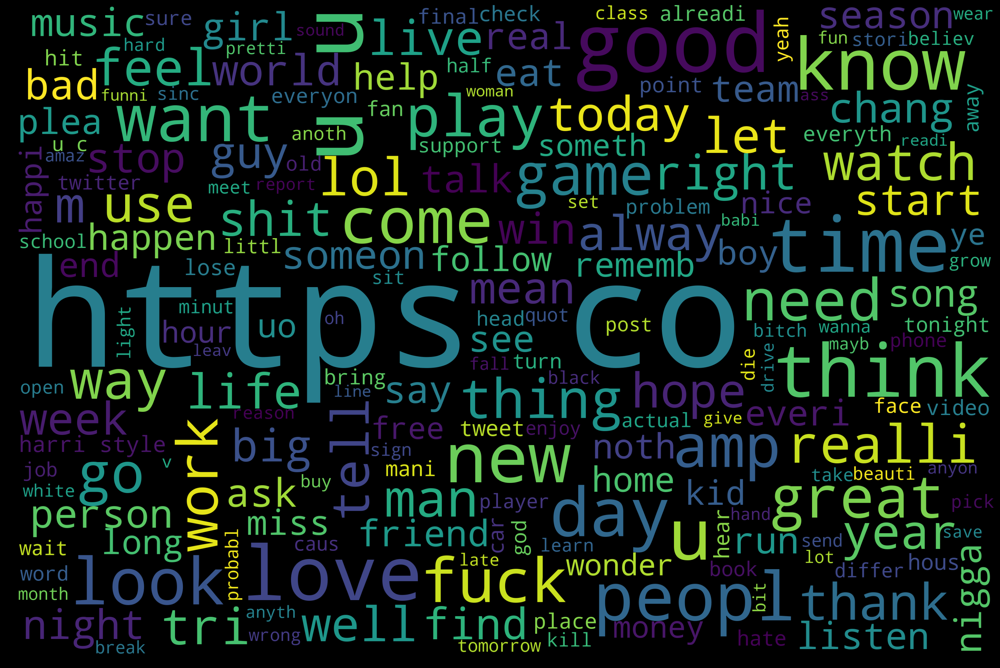

In [ ]:
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud) # image show

In [ ]:
female_tokens = []
for tokens in female.tokens:
  female_tokens.extend(tokens)

wordcloud = WordCloud (
                        width = 3000,
                        height = 2000,
                        background_color = 'black',
                        ).generate(' '.join(female_tokens))

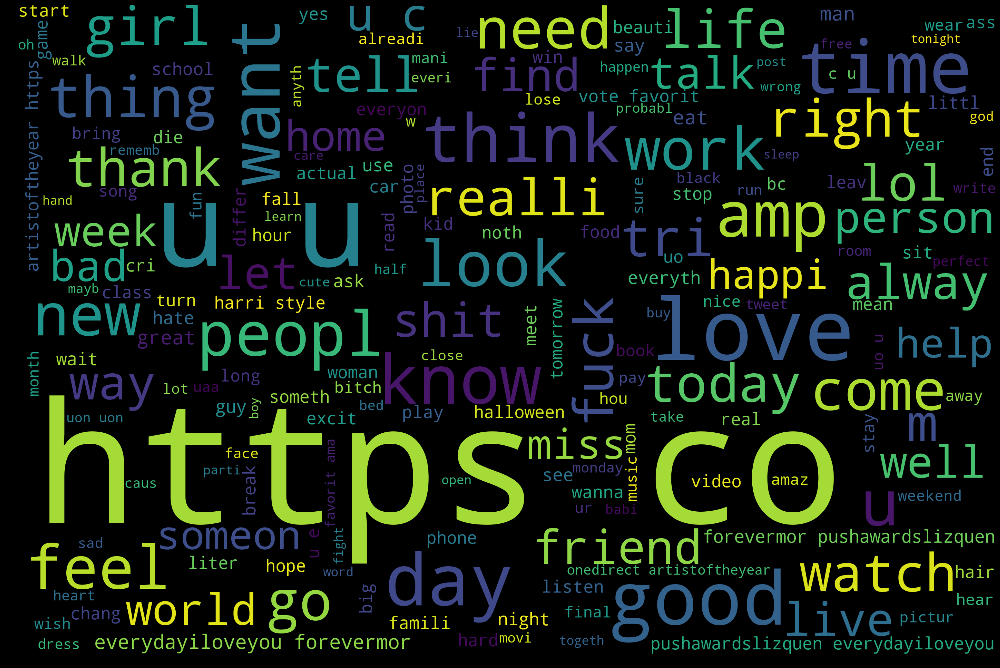

In [ ]:
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud) # image show

In [ ]:
brand_tokens = []
for tokens in brand.tokens:
  brand_tokens.extend(tokens)

wordcloud = WordCloud (
                        width = 3000,
                        height = 2000,
                        background_color = 'black',
                        ).generate(' '.join(brand_tokens))

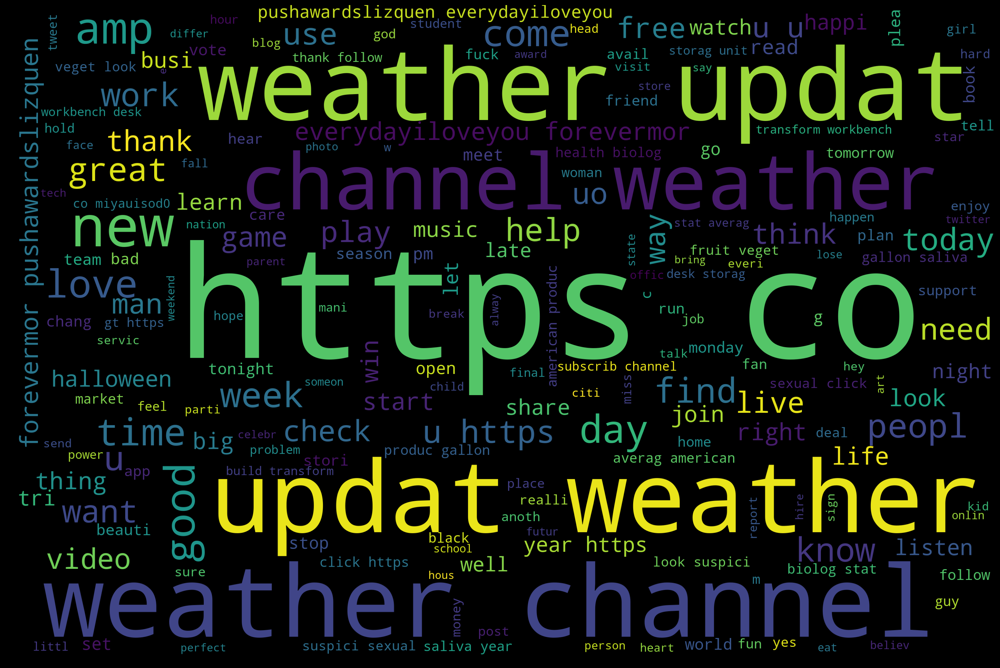

In [ ]:
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')

plt.imshow(wordcloud) # image show

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer()

###
df_new = male.append(female)
###
# male.text.progress_apply()

In [ ]:
df_new["new_text"] = df_new["tokens"].apply(lambda x: " ".join(x))

In [ ]:
df_new.head()

,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,gender,gender:confidence,profile_yn,profile_yn:confidence,created,...,text,tweet_coord,tweet_count,tweet_created,tweet_id,tweet_location,user_timezone,tokens,text_clean,new_text
0,815719226,False,finalized,3,10/26/15 23:24,male,1.0000,yes,1.0,12/5/13 1:48,...,Robbie E Responds To Critics After Win Against...,NaN,110964,10/26/15 12:40,6.587300e+17,main; @Kan1shk3,Chennai,"[robbi, e, respond, critic, win, eddi, edward,...",robbi e respond critic win eddi edward worldti...,robbi e respond critic win eddi edward worldti...
1,815719227,False,finalized,3,10/26/15 23:30,male,1.0000,yes,1.0,10/1/12 13:51,...,ÛÏIt felt like they were my friends and I was...,NaN,7471,10/26/15 12:40,6.587300e+17,NaN,Eastern Time (US & Canada),"[uiit, feel, like, friend, live, stori, themu,...",uiit felt like friend live stori themu https c...,uiit feel like friend live stori themu https c...
2,815719228,False,finalized,3,10/26/15 23:33,male,0.6625,yes,1.0,11/28/14 11:30,...,i absolutely adore when louis starts the songs...,NaN,5617,10/26/15 12:40,6.587300e+17,clcncl,Belgrade,"[absolut, ador, loui, start, song, hit, hard, ...",absolut ador loui start song hit hard feel good,absolut ador loui start song hit hard feel good
3,815719229,False,finalized,3,10/26/15 23:10,male,1.0000,yes,1.0,6/11/09 22:39,...,Hi @JordanSpieth - Looking at the url - do you...,NaN,1693,10/26/15 12:40,6.587300e+17,"Palo Alto, CA",Pacific Time (US & Canada),"[hi, jordanspieth, look, url, use, ifttt, typi...",hi jordanspieth look url use ifttt typic see a...,hi jordanspieth look url use ifttt typic advan...
7,815719233,False,finalized,3,10/26/15 23:48,male,1.0000,yes,1.0,12/3/12 21:54,...,Gala Bingo clubs bought for å£241m: The UK's l...,NaN,112117,10/26/15 12:40,6.587300e+17,NaN,NaN,"[gala, bingo, club, buy, aps241, m, uk, large,...",gala bingo club bought aps241m uk largest high...,gala bingo club buy aps241 m uk large high str...


In [ ]:
cv.fit(df_new.new_text)

CountVectorizer()

In [ ]:
df_new["vector"] = df_new.new_text.apply(lambda x: cv.transform([x]).toarray()[0])

In [ ]:
X = df_new.vector.to_numpy()
t = pd.DataFrame(X)
df3 = pd.DataFrame(t[0].to_list(), columns=[np.arange(len(df_new.vector[0]))])


In [ ]:
y = df_new.gender

# Perform PCA
pca = PCA(n_components=2)
pca.fit(df3)
X_pca = pca.transform(df3)


/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



In [ ]:
# Visualize the results
fig = px.scatter(x=X_pca[:, 0], y=X_pca[:, 1], color=y, opacity= 0.4)
fig.show()

In [ ]:
y = df_new.gender

# Perform PCA
pca = PCA(n_components=3)
pca.fit(df3)
X_pca = pca.transform(df3)


/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



In [ ]:
# Visualize the results
fig = px.scatter_3d(x=X_pca[:, 0], y=X_pca[:, 1], z=X_pca[:, 2], color=y, opacity= 0.4)
fig.show()

### Visualization of dimensially reduced dataset using tf-idf

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer


In [ ]:
tf_idf = TfidfVectorizer()

tf_idf.fit(df_new.new_text)

df_new["vector_tf_idf"] = df_new.new_text.apply(lambda x: tf_idf.transform([x]).toarray()[0])

In [ ]:
df_new.head()

,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,gender,gender:confidence,profile_yn,profile_yn:confidence,created,...,tweet_count,tweet_created,tweet_id,tweet_location,user_timezone,tokens,text_clean,new_text,vector,vector_tf_idf
0,815719226,False,finalized,3,10/26/15 23:24,male,1.0000,yes,1.0,12/5/13 1:48,...,110964,10/26/15 12:40,6.587300e+17,main; @Kan1shk3,Chennai,"[robbi, e, respond, critic, win, eddi, edward,...",robbi e respond critic win eddi edward worldti...,robbi e respond critic win eddi edward worldti...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,815719227,False,finalized,3,10/26/15 23:30,male,1.0000,yes,1.0,10/1/12 13:51,...,7471,10/26/15 12:40,6.587300e+17,NaN,Eastern Time (US & Canada),"[uiit, feel, like, friend, live, stori, themu,...",uiit felt like friend live stori themu https c...,uiit feel like friend live stori themu https c...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,815719228,False,finalized,3,10/26/15 23:33,male,0.6625,yes,1.0,11/28/14 11:30,...,5617,10/26/15 12:40,6.587300e+17,clcncl,Belgrade,"[absolut, ador, loui, start, song, hit, hard, ...",absolut ador loui start song hit hard feel good,absolut ador loui start song hit hard feel good,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,815719229,False,finalized,3,10/26/15 23:10,male,1.0000,yes,1.0,6/11/09 22:39,...,1693,10/26/15 12:40,6.587300e+17,"Palo Alto, CA",Pacific Time (US & Canada),"[hi, jordanspieth, look, url, use, ifttt, typi...",hi jordanspieth look url use ifttt typic see a...,hi jordanspieth look url use ifttt typic advan...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,815719233,False,finalized,3,10/26/15 23:48,male,1.0000,yes,1.0,12/3/12 21:54,...,112117,10/26/15 12:40,6.587300e+17,NaN,NaN,"[gala, bingo, club, buy, aps241, m, uk, large,...",gala bingo club bought aps241m uk largest high...,gala bingo club buy aps241 m uk large high str...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [ ]:
X = df_new.vector_tf_idf.to_numpy()
t = pd.DataFrame(X)
df3 = pd.DataFrame(t[0].to_list(), columns=[np.arange(len(df_new.vector_tf_idf[0]))])


In [ ]:


y = df_new.gender

# Perform PCA
pca = PCA(n_components=2)
pca.fit(df3)
X_pca = pca.transform(df3)


/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



In [ ]:
# Visualize the results
fig = px.scatter(x=X_pca[:, 0], y=X_pca[:, 1], color=y, opacity= 0.4)
fig.show()

In [ ]:
y = df_new.gender

# Perform PCA
pca = PCA(n_components=3)
pca.fit(df3)
X_pca = pca.transform(df3)


/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning:

Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.



In [ ]:
# Visualize the results
fig = px.scatter_3d(x=X_pca[:, 0], y=X_pca[:, 1], z=X_pca[:, 2], color=y, opacity= 0.4)
fig.show()

In [ ]:
mapping = {'female': 0, 'male': 1}
df_new["gender"] = df_new["gender"].map(mapping)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['vector']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
knn = KNeighborsClassifier(metric='cosine')
knn.fit(X_train, y_train)

y_predicted = knn.predict(X_test)

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.56      0.63      0.59      1340
           1       0.54      0.46      0.49      1239

    accuracy                           0.55      2579
   macro avg       0.55      0.55      0.54      2579
weighted avg       0.55      0.55      0.55      2579



In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['vector_tf_idf']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
knn = KNeighborsClassifier(metric='cosine')
knn.fit(X_train, y_train)

y_predicted = knn.predict(X_test)

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.58      0.68      0.63      1340
           1       0.57      0.46      0.51      1239

    accuracy                           0.58      2579
   macro avg       0.57      0.57      0.57      2579
weighted avg       0.57      0.58      0.57      2579



In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['vector']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_predicted = rf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.59      0.77      0.67      1340
           1       0.64      0.43      0.51      1239

    accuracy                           0.61      2579
   macro avg       0.62      0.60      0.59      2579
weighted avg       0.61      0.61      0.60      2579



In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['vector_tf_idf']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_predicted = rf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.60      0.64      0.62      1340
           1       0.58      0.55      0.57      1239

    accuracy                           0.59      2579
   macro avg       0.59      0.59      0.59      2579
weighted avg       0.59      0.59      0.59      2579



In [ ]:
nlp = spacy.load("en_core_web_lg")

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/spacy/util.py:877: UserWarning:

[W095] Model 'en_core_web_lg' (3.3.0) was trained with spaCy v3.3 and may not be 100% compatible with the current version (3.5.0). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate



In [ ]:
df_new["vector_tok2vec"] = df_new["text_clean"].apply(lambda x: nlp(x).vector)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['vector_tok2vec']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
knn = KNeighborsClassifier(metric='cosine')
knn.fit(X_train, y_train)

y_predicted = knn.predict(X_test)

/Users/ali/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.57      0.65      0.61      1340
           1       0.56      0.47      0.51      1239

    accuracy                           0.56      2579
   macro avg       0.56      0.56      0.56      2579
weighted avg       0.56      0.56      0.56      2579



In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['vector_tok2vec']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_predicted = rf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.61      0.68      0.64      1340
           1       0.60      0.53      0.56      1239

    accuracy                           0.61      2579
   macro avg       0.60      0.60      0.60      2579
weighted avg       0.60      0.61      0.60      2579



In [ ]:
import fasttext

In [ ]:
model_en = fasttext.load_model("./crawl-300d-2M-subword/crawl-300d-2M-subword.bin")

In [ ]:
def vectorize(text):
    return model_en.get_word_vector(text)

df_new["fasttext_vector"] = df_new["text_clean"].apply(vectorize)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split([l for l in df_new['fasttext_vector']], df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_predicted = rf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.56      0.68      0.61      1340
           1       0.55      0.42      0.48      1239

    accuracy                           0.56      2579
   macro avg       0.55      0.55      0.55      2579
weighted avg       0.55      0.56      0.55      2579



In [ ]:
pip install transformers

  Using cached transformers-4.26.0-py3-none-any.whl (6.3 MB)
  Using cached tokenizers-0.13.2-cp39-cp39-macosx_10_11_x86_64.whl (3.8 MB)
  Using cached huggingface_hub-0.12.0-py3-none-any.whl (190 kB)
Note: you may need to restart the kernel to use updated packages.


In [ ]:
from transformers import AutoTokenizer

In [ ]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("bert-base-cased")
tokenized_data = tokenizer(list(df_new["text"]), return_tensors="np", padding=True)
# Tokenizer returns a BatchEncoding, but we convert that to a dict for Keras
tokenized_data = dict(tokenized_data)

labels = np.array(df_new["gender"].map({"female": 0, "male": 1}))  # Label is already an array of 0 and 1

In [ ]:
import tensorflow

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
from transformers import TFAutoModelForSequenceClassification
from tensorflow.keras.optimizers import Adam

# Load and compile our model
model = TFAutoModelForSequenceClassification.from_pretrained("bert-base-cased")
# Lower learning rates are often better for fine-tuning transformers
model.compile(optimizer=Adam(3e-5))

model.fit(tokenized_data, labels, epochs=10, steps_per_epoch=5)

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
### From here:

In [ ]:
! pip install sentence_transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 KB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 42.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 56.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 55.3 MB/s eta 0:00:00
  Created wheel for sentence_transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=04bb56ee0a759f4c55b861f08102adc8e79cf95c79ced058fca7d2bc751558c8
  Stored in directory: /root/.cache/pip/wheels/5e/6f/8c/d88aec621f3f542d26fac0342bef5e693335d125f4e54aeffe
Successfully built sentence_transformers


In [ ]:
from sentence_transformers import SentenceTransformer, util
Bert_model = SentenceTransformer('bert-base-cased')
# Bert_model.max_seq_length = 200

Some weights of the model checkpoint at /root/.cache/torch/sentence_transformers/bert-base-cased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
bert_encoded = Bert_model.encode(list(df_new["text"]))

In [ ]:
bert_encoded

array([[ 0.06121195, -0.13018586, -0.17369325, ...,  0.21048419,
         0.1551302 ,  0.14176011],
       [ 0.16871047, -0.2006595 , -0.02227232, ...,  0.33968014,
         0.15415154,  0.10655046],
       [ 0.20808524,  0.23096855,  0.00357303, ...,  0.3843139 ,
         0.14734104,  0.10906047],
       ...,
       [ 0.22636615,  0.20169498, -0.13813473, ...,  0.31448516,
         0.07420527,  0.22852929],
       [ 0.35045752,  0.01238999, -0.11784445, ...,  0.10267986,
         0.19710484,  0.21963225],
       [ 0.2960514 ,  0.24820957, -0.10135192, ...,  0.217636  ,
         0.34468356,  0.19290203]], dtype=float32)

In [ ]:
import pickle
 
file = open('Bert', 'wb')

# dump information to that file
pickle.dump(bert_encoded, file)

file.close()

In [ ]:
df_new["gender"] = df_new["gender"].map({'female': 0, 'male': 1})

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(bert_encoded, df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
knn = KNeighborsClassifier(metric='cosine')
knn.fit(X_train, y_train)

y_predicted = knn.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.61      0.63      0.62      1340
           1       0.58      0.56      0.57      1239

    accuracy                           0.59      2579
   macro avg       0.59      0.59      0.59      2579
weighted avg       0.59      0.59      0.59      2579



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(bert_encoded, df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_predicted = rf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.65      0.71      0.68      1340
           1       0.66      0.59      0.62      1239

    accuracy                           0.65      2579
   macro avg       0.65      0.65      0.65      2579
weighted avg       0.65      0.65      0.65      2579



In [ ]:
y_train

10139    1
8060     0
4952     0
11155    0
6502     1
        ..
11915    1
15803    1
8864     1
3105     0
13862    0
Name: gender, Length: 10315, dtype: int64

In [ ]:
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential

X_train, X_test, y_train, y_test = train_test_split(bert_encoded, df_new.gender, test_size=0.2, random_state=42, stratify= df_new.gender)


model = Sequential()

model.add(Dense(10, activation='relu', input_shape=(X_train.shape[1], )))
model.add(Dropout(0.5))
model.add(Dense(10, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


In [ ]:
history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test))


Epoch 1/50
162/162 [==============================] - 2s 7ms/step - loss: 0.6945 - accuracy: 0.5274 - val_loss: 0.6811 - val_accuracy: 0.5312
Epoch 2/50
162/162 [==============================] - 1s 6ms/step - loss: 0.6818 - accuracy: 0.5473 - val_loss: 0.6714 - val_accuracy: 0.6029
Epoch 3/50
162/162 [==============================] - 1s 6ms/step - loss: 0.6729 - accuracy: 0.5687 - val_loss: 0.6593 - val_accuracy: 0.6363
Epoch 4/50
162/162 [==============================] - 1s 7ms/step - loss: 0.6709 - accuracy: 0.5720 - val_loss: 0.6577 - val_accuracy: 0.6150
Epoch 5/50
162/162 [==============================] - 1s 6ms/step - loss: 0.6658 - accuracy: 0.5746 - val_loss: 0.6460 - val_accuracy: 0.6534
Epoch 6/50
162/162 [==============================] - 1s 6ms/step - loss: 0.6648 - accuracy: 0.5846 - val_loss: 0.6374 - val_accuracy: 0.6390
Epoch 7/50
162/162 [==============================] - 1s 6ms/step - loss: 0.6664 - accuracy: 0.5821 - val_loss: 0.6528 - val_accuracy: 0.6328
Epoch 

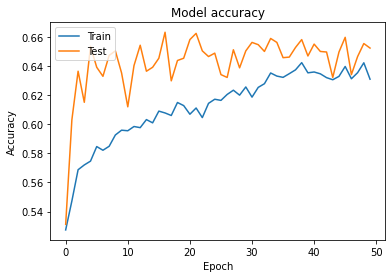

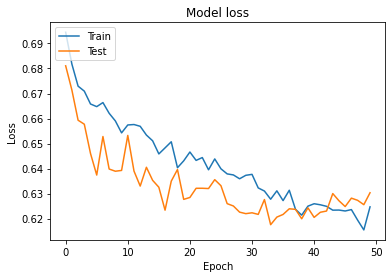

In [ ]:
# Plot training & validation accuracy values
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()
